# Question 1: How are Houses in Kings County Distributed and the effect of Zipcodes on price

**Are some zip codes more densely built up than others?**

Yes, zipcodes directly surrounding Bellevue have higher counts of houses than zip codes further out. 


**Do House Prices vary by Zipcode**

From below, it is clear that the average house price is very different based on the zipcode

**Where are the most expensive houses located**

Houses in the North of the County, notably surrounding bellevue, are the most expensive

With houses in the south of the county being cheaper

In [6]:
import pandas as pd
import json
import folium
from folium.plugins import MarkerCluster # for clustering the markers
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import scipy.stats as scs
import numpy as np

In [7]:
df= pd.read_csv('../data/datawithnewcols.csv',index_col=0)

In [8]:
df['sqft_living'].value_counts()

1300    125
1440    121
1400    120
1820    118
1660    113
       ... 
2905      1
2793      1
4810      1
2665      1
2007      1
Name: sqft_living, Length: 992, dtype: int64

In [9]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_lot15,Age_of_House,Years_last_renovation,basement,biggerliving,biggerlot,distance_from_seattle,distance_from_bellevue,distance_from_a_city,distance_from_airport
0,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7639,69,29,1,1,0,12.613856,15.150174,12.613856,30.859494
1,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,8062,87,87,0,0,1,16.333282,14.375822,14.375822,33.112379
2,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,5000,55,55,1,1,0,10.617501,17.522706,10.617501,10.988905
3,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,7503,33,33,0,0,1,21.759524,11.683886,11.683886,27.230991
4,7237550310,2014-05-12,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,...,101930,19,19,1,1,0,25.295727,15.508940,15.508940,32.449837


In [10]:
zipcodedf = df.groupby('zipcode')['price'].agg(['mean','count','median'])
zipcodedf.reset_index(inplace = True)

In [11]:
zipcodedf['zipcode'] = zipcodedf['zipcode'].map(lambda x:str(x))
zipcodedf['mean'] = zipcodedf['mean'].astype('int64')

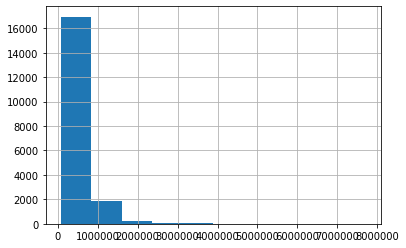

In [12]:
df['price'].hist();

In [13]:
zipcodedf.head()

,zipcode,mean,count,median
0,98001,278733,328,259450.0
1,98002,235291,179,235000.0
2,98003,288682,255,264000.0
3,98004,1369662,283,1190000.0
4,98005,813864,158,772325.0


In [14]:
with open('../data/Zip_Codes.geojson','r') as jsonFile:
    data = json.load(jsonFile)

In [15]:
geozips = []
for i in range(len(data['features'])):
    if data['features'][i]['properties']['ZIPCODE'] in list(zipcodedf['zipcode'].unique()):
        geozips.append(data['features'][i])


In [16]:
new_json = dict.fromkeys(['type','feature'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips

In [17]:
open("../data/cleaned_geodata.json", "w").write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': ')))

14932243

In [18]:
kc_geo = r'../data/cleaned_geodata.json'

In [19]:
m = folium.Map(location=[47.608013, -122.335167], default_zoom_start=11)

folium.GeoJson(
    kc_geo,
    name='geojson'
).add_to(m)

In [20]:
m.save(outfile = 'file.html')


# Function to Create Map to show characteristics of Zipcodes

In [23]:
def create_map_Kc_County(df=zipcodedf,col='count',legend =' Insert legend description basd '):
    """
    Generates a folium map of Seattle
    :param zipcode_data: zipcode dataset
    :param col: feature to display
    :param legend: Insert description for legend based on feature
    :return: mp
    """ 
    
    mp = folium.Map(location=[47.608013, -122.335167], default_zoom_start=11)

    folium.Choropleth(geo_data=kc_geo, 
                # my dataset                      
                 data=df, 
                # zip code is here for matching the geojson zipcode, col changes the color of zipcode areas
                 columns=['zipcode', col],
                # this path contains zipcodes in str type, this zipcodes should match with our ZIP CODE column
                 key_on='feature.properties.ZIPCODE', 
                 fill_color='Reds', legend_name=legend,fill_opacity=0.7, line_opacity=0.3).add_to(mp)
   
    mp.save(outfile = '../maps/'+ col + '.html')
    

# Create Map for number of houses per zipcode

In [22]:
create_map_Kc_County(df=zipcodedf, col='count', legend = "Number of Houses in Zipcode" )

ValueError: All values are expected to fall into one of the provided bins (or to be Nan). Please check the `bins` parameter and/or your data.

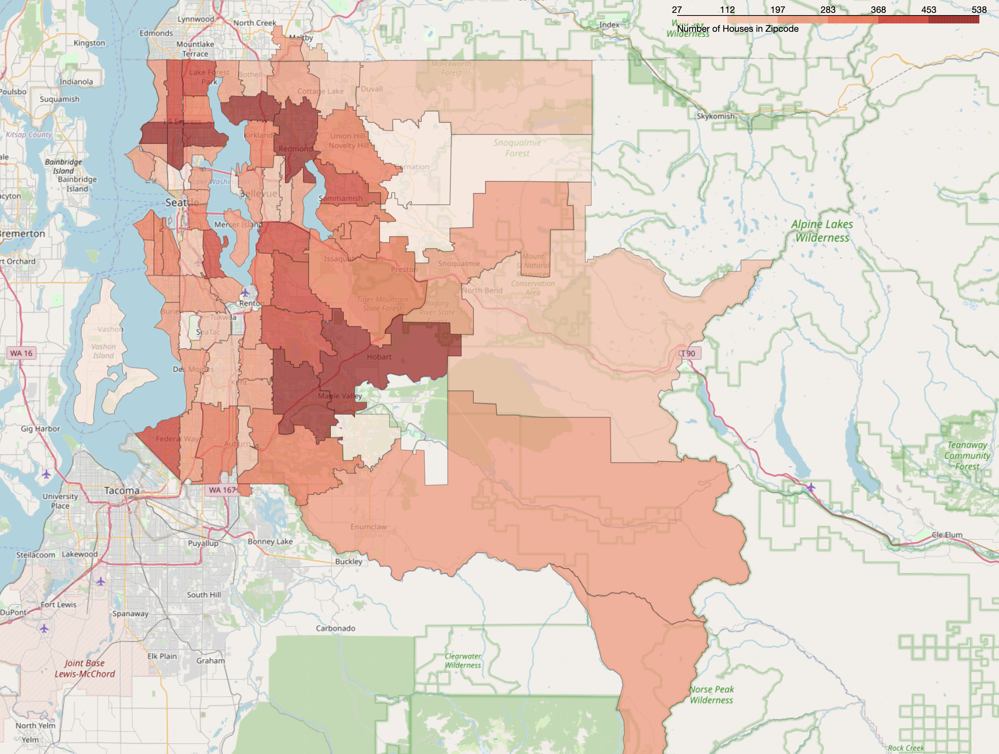

In [39]:
from IPython.display import Image
Image(filename = '../Images/mapwithcounts.png', width=1000, height=1000)

# Create Map for average house price

In [16]:
create_map_Kc_County(df=zipcodedf,col='median',legend = "Average Price per home in zipcode")

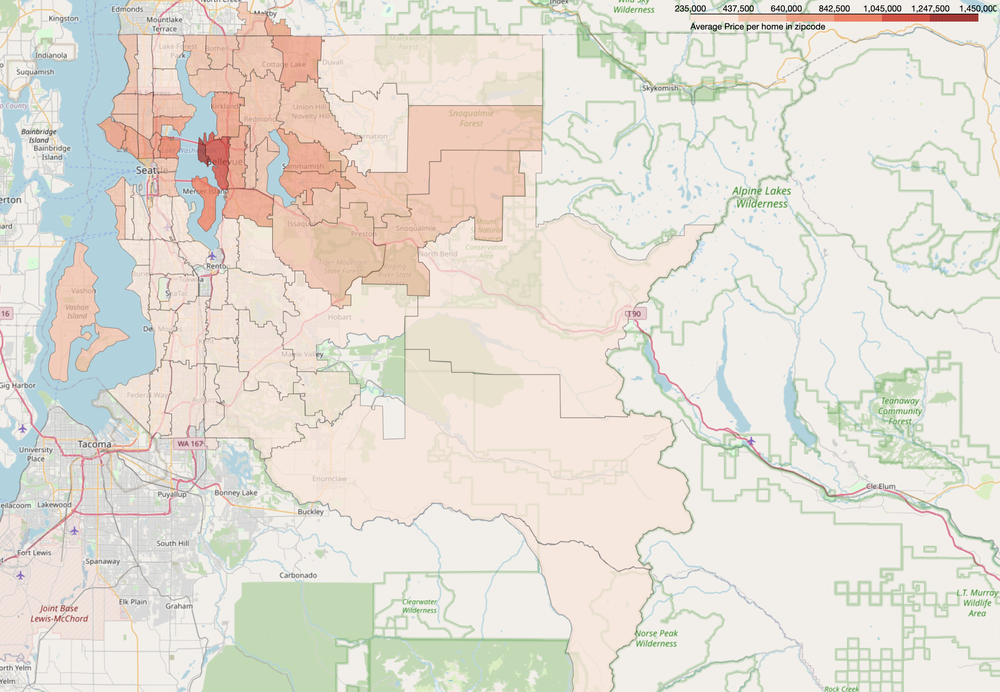

In [46]:
Image(filename = '../Images/mapwithprice.png', width=1000, height=1000)

# Creating Map with markers for each house

In [17]:
mp = folium.Map(location=[47.610378, -122.200676], default_zoom_start=11)

# add a marker for every record in the filtered data, use a clustered view
marker_cluster = MarkerCluster().add_to(mp) # create marker clusters
for i in range(df.shape[0]):
    location = [df['lat'][i],df['long'][i]]
    tooltip = f"House ID: {df['id'][i]}"

    folium.Marker(location=location,tooltip=tooltip).add_to(marker_cluster)

folium.Circle([47.610378, -122.200676],
                    radius=15000
                   ).add_to(mp)

mp.save(outfile = '../maps/my_map.html')

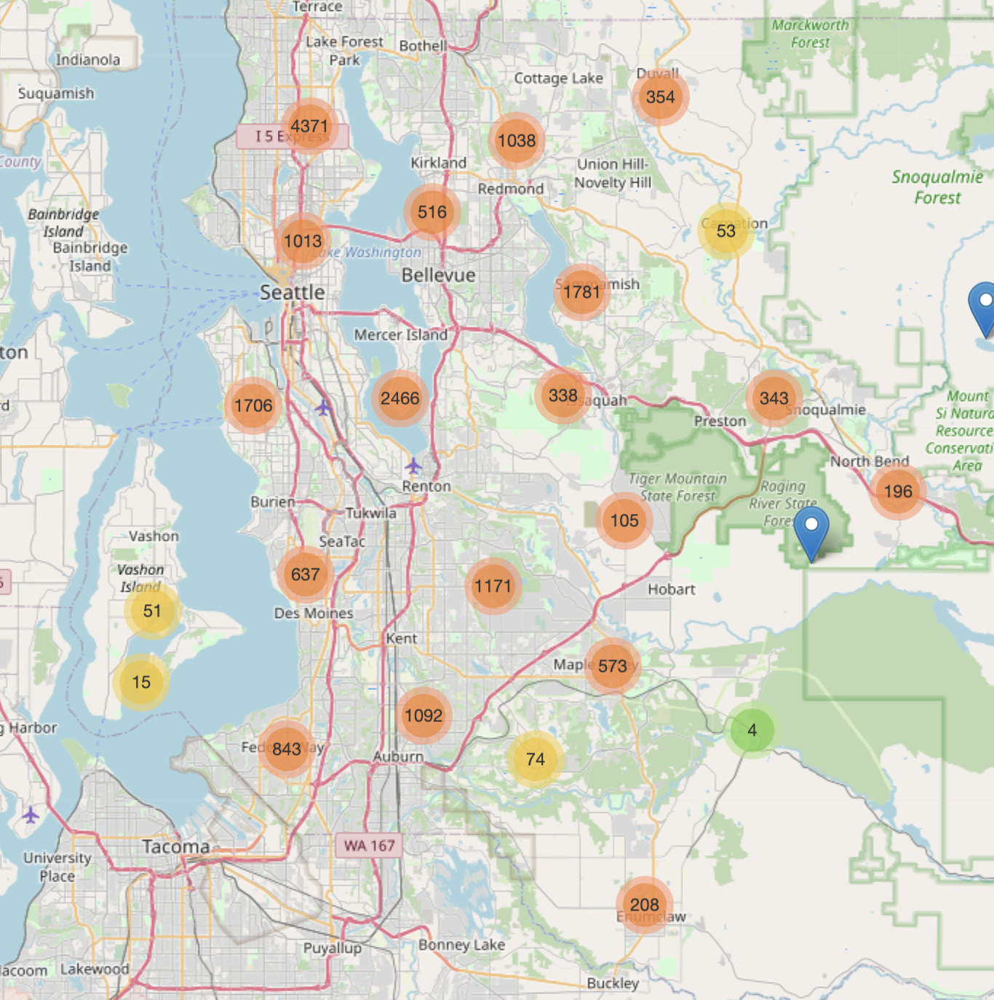

In [49]:
Image(filename = '../Images/distributionofhouses.png', width=1000, height=1000)

# Plotting Long and lat of each house to see distribution of House Price

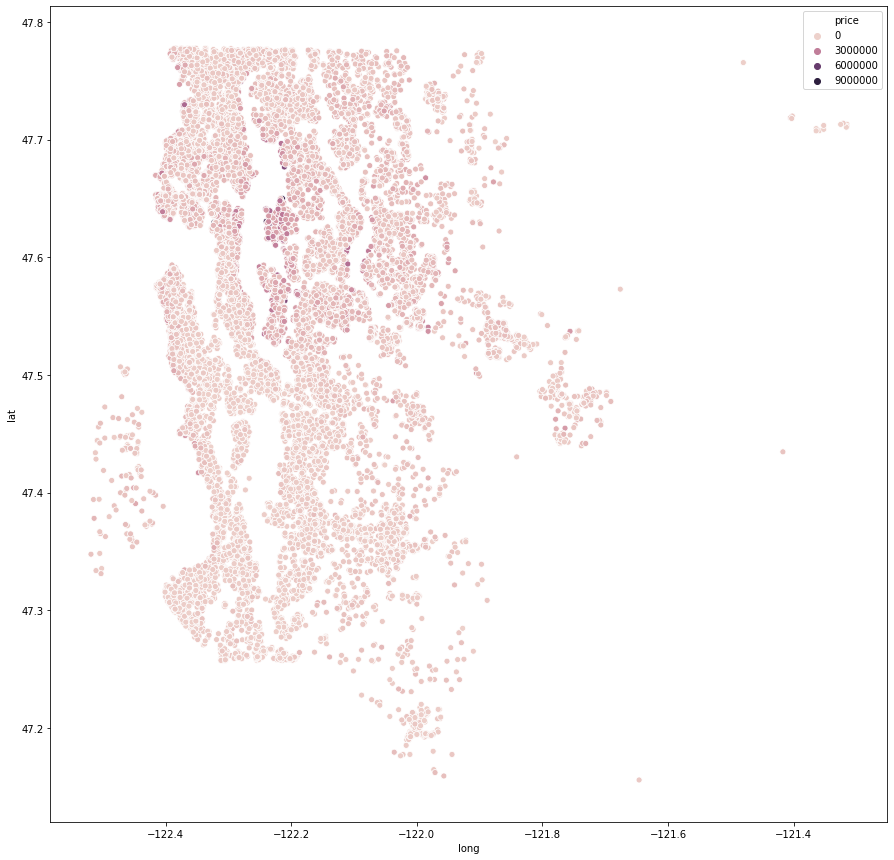

In [50]:
plt.figure(figsize= (15,15))
sns.scatterplot(x='long', y ='lat', data=df,hue='price')

# Removing price outliers

In [51]:
def remove_outliers(df, col, threshold = 3):
    zscores = scs.zscore(df[col])
    indices = np.abs(np.where(zscores > threshold))
    return indices[0]

check_col = ['price']

all_indices = []
for col in check_col:
    indices = remove_outliers(df, col, threshold = 3)
    all_indices.extend(indices)
all_indices = np.unique(all_indices)

In [52]:
df.drop(all_indices, axis=0,inplace = True)

In [53]:
df.reset_index(inplace=True)

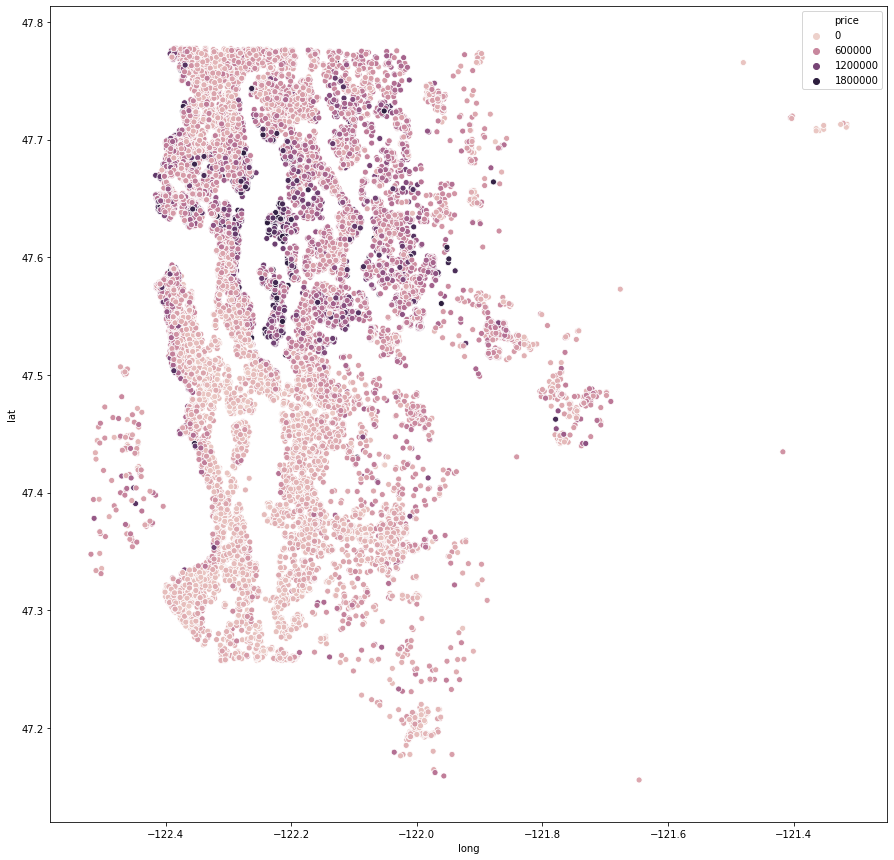

In [54]:
plt.figure(figsize= (15,15))
sns.scatterplot(x='long', y ='lat', data=df,hue='price')

**After dropping price outliers we have a better view of the distribution of house prices**

In [55]:
df.corr()['price']

index                     0.029633
id                       -0.005152
price                     1.000000
bedrooms                  0.313647
bathrooms                 0.495684
sqft_living               0.665792
sqft_lot                  0.094299
floors                    0.279738
waterfront                0.109334
view                      0.318716
condition                 0.038184
grade                     0.672900
sqft_above                0.568546
sqft_basement             0.273112
yr_built                  0.061319
yr_renovated              0.099638
zipcode                  -0.031214
lat                       0.385107
long                      0.047077
sqft_living15             0.594492
sqft_lot15                0.089031
Age_of_House             -0.061319
Years_last_renovation    -0.099638
basement                  0.174797
biggerliving              0.226758
biggerlot                 0.039591
distance_from_seattle    -0.314929
distance_from_bellevue   -0.453904
distance_from_a_city

In [56]:
df['price'].describe()

count    1.887000e+04
mean     5.083714e+05
std      2.619462e+05
min      7.800000e+04
25%      3.200000e+05
50%      4.490000e+05
75%      6.275000e+05
max      1.650000e+06
Name: price, dtype: float64

# 10 Cheapest Zipcodes by House Price


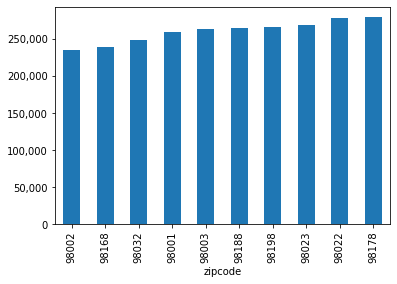

In [57]:
ax = df.groupby('zipcode')['price'].median().sort_values(ascending = True)[:10].plot(kind='bar')

ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
plt.show()

# 10 Expensive Zipcodes by House Price

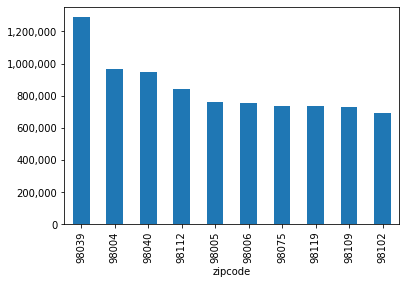

In [58]:
ax = df.groupby('zipcode')['price'].median().sort_values(ascending = False)[:10].plot(kind='bar')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
plt.show()

the Average house price in the 10 cheapest zipcodes is appoximatey USD 250,000

In the 10 most expensive zipcodes, house prices range from an average of USD 800,000 to USD 1.2m

This clearly shows the disaparity in house prices based on zipcodes, and that the zipcode has an effect on price

In [59]:
df.groupby('zipcode')['price'].median().sort_values(ascending = False)[:10]

zipcode
98039    1290000.0
98004     968000.0
98040     950000.0
98112     841250.0
98005     762450.0
98006     753000.0
98075     735000.0
98119     735000.0
98109     730500.0
98102     690000.0
Name: price, dtype: float64

In [60]:
zip98102 = df.loc[df['zipcode']==98102]

In [61]:
zip98102['price'].min()

330000.0

In [62]:
zip98102['price'].max()

1600000.0

In [63]:
zip98102['price'].median()

690000.0

In [64]:
dftop1000 = df.sort_values(by='price',ascending = False)[:1000]

In [65]:
mosthousesintop1000 = dftop1000.groupby('zipcode')['price'].count().sort_values(ascending = False)[:5]/1000

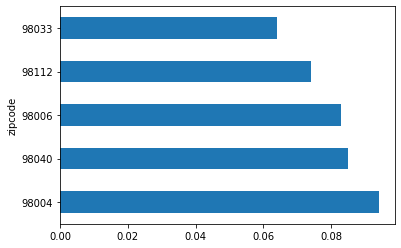

In [66]:
mosthousesintop1000.plot(kind='barh')